# Lecture 12: Multimodal data processing

- Working with audio, image, and video data

## Learning objectives

By the end of this lecture, you should:

- Understand the relevance of multimodal data in computational linguistics
- Understand how digital audio, images, and videos can be represented
- Be able to inspect and manipulate audio and image data using NumPy
- Be aware of some commonly used Python libraries for audio, image, and video processing

## Why should you care about multimodal data?

Language is inherently multimodal:

- Audio: spoken language, prosody, ...
- Images: handwriting, facial expressions, pictograms, ...
- Video: sign language, body language, ...
- Cognition data: eye-tracking, EEG, MRI, ...

**Written language is not the most important modality of language, it's just the easiest to work with.**

### Modalities other than text in natural language processing

| Modality | as input | as output |
| --- | --- | --- |
| Audio | speech recognition, speech translation, subtitling | text-to-speech |
| Image | optical character recognition, image captioning | image generation |
| Video | sign language recognition, sign language translation, scene captioning, audio description | sign language translation |

### Multimodal research at the Department of Computational Linguistics

- [Language, Technology and Accessibility](https://www.cl.uzh.ch/en/research-groups/accessibility.html) (Prof. Sarah Ebling): sign language, audio description, pictographs, text simplification with images
- [Phonetics](https://www.cl.uzh.ch/en/research-groups/phonetics.html) (Prof. Volker Dellwo): speech processing, speaker recognition
- [Digital Linguistics](https://www.cl.uzh.ch/en/research-groups/digital-linguistics.html) (Prof. Lena Jäger): eye-tracking
- [Computational Neuroscience of Speech & Hearing](https://www.cl.uzh.ch/en/research-groups/neuro.html) (Prof. Nathalie Giroud): EEG, MRI

In [5]:
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Audio, Image, Video

## Audio data

In [3]:
Audio(filename="tongue-twister.wav")

In its most basic form, an audio file is a sequence of `float`s:

263808 samples at 44100 samples per second


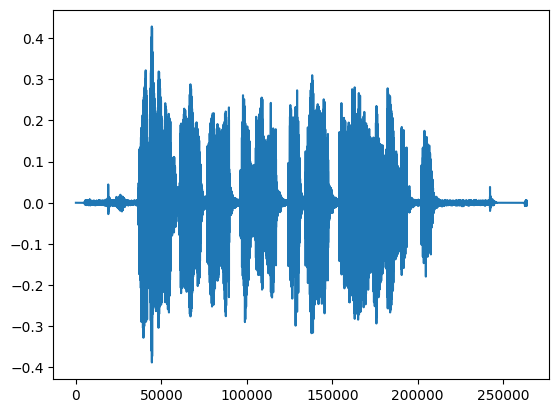

In [7]:
import soundfile as sf

audio, sampling_rate = sf.read('tongue-twister.wav')
print(f"{len(audio)} samples at {sampling_rate} samples per second")
plt.plot(audio)

### Waveform

Text(0, 0.5, 'Amplitude')

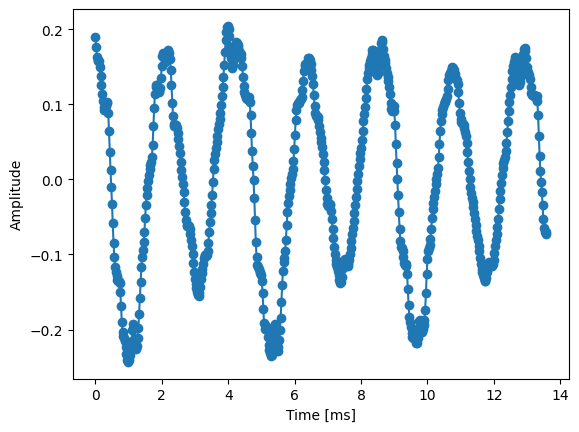

In [8]:
waveform = audio[50000:50600]
time = np.arange(len(waveform)) / sampling_rate * 1000
plt.plot(time, waveform, marker='o')
plt.xlabel('Time [ms]')
plt.ylabel('Amplitude')

- **Sampling rate** [Hz]: number of samples per second; "resolution" of the signal
- **Frequency** [Hz]: number of oscillations per second; perceived as pitch
- **Amplitude** [no unit]: perceived as loudness

Typical fundamental frequencies of the human voice:

- Adult male: 90-155 Hz
- Adult female: 165-255 Hz

#### Sine waves are pure tones

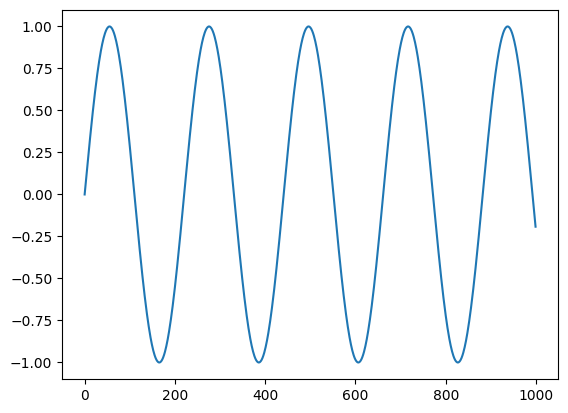

In [9]:
def sinewave(frequency, amplitude=1, length=1, rate=44100):
    x = np.linspace(0, 2 * np.pi * frequency * length, round(length * rate))
    return np.sin(x) * amplitude

wave = sinewave(200)
plt.plot(wave[:1000])
Audio(wave, rate=44100)

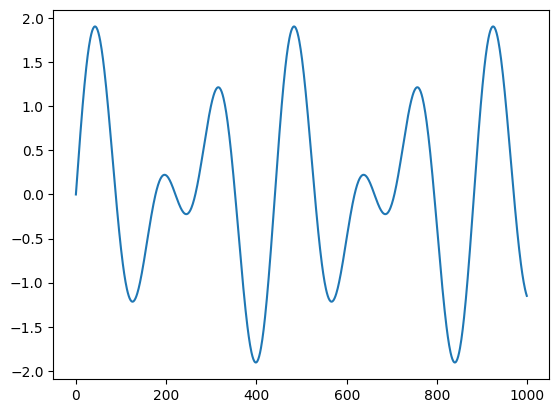

In [10]:
wave = sinewave(200) + sinewave(300)
plt.plot(wave[:1000])
Audio(wave, rate=44100)

### Spectrogram

- Every periodic signal can be decomposed into a sum of sine waves.
- The combination of frequencies that make up a sound determines how it sounds.
- A **spectrogram** tells us what frequencies are present in the signal at each point in time.

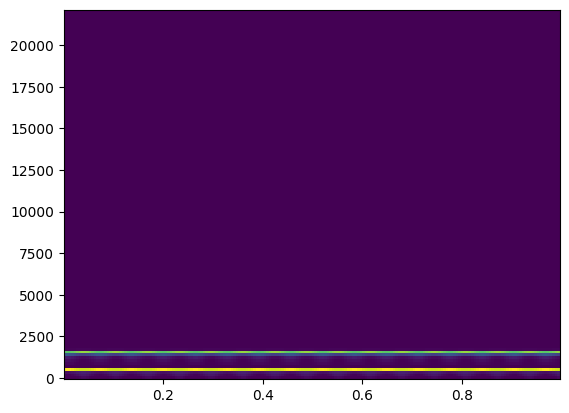

In [11]:
wave = sinewave(500) + sinewave(1500)
f, t, Sxx = scipy.signal.spectrogram(wave, fs=44100)
plt.pcolormesh(t, f, Sxx)
Audio(wave, rate=44100)

### Spectrogram of human speech

![Spectrogram of three vowels](img/spectrogram.png)

> **NOTE:** We do not expect you to understand the specifics of phonetics or acoustics. For the exam, we only expect you to have a basic understanding of how audio data is represented and processed in general.

#### Average vowel formants for a male voice

| Vowel (IPA) | Formant F1 (Hz) | Formant F2 (Hz) |
| --- | --- | --- |
| i | 240 | 2400 | 2160 |
| y | 235 | 2100 | 1865 |
| e | 390 | 2300 | 1910 |
| ø | 370 | 1900 | 1530 |
| ɛ | 610 | 1900 | 1290 |
| œ | 585 | 1710 | 1125 |

Source: https://en.wikipedia.org/wiki/Formant

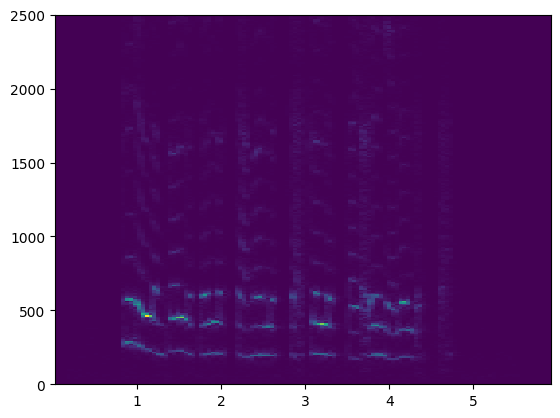

In [12]:
def plot_spectrogram(data, sampling_rate, ylim=None):
    f, t, Sxx = scipy.signal.spectrogram(data, fs=sampling_rate, nperseg=4096, noverlap=2048, mode='magnitude')
    plt.pcolormesh(t, f, Sxx)
    if ylim is not None:
        plt.ylim(ylim)

audio, sampling_rate = sf.read('tongue-twister.wav')
plot_spectrogram(audio, sampling_rate, ylim=[0, 2500])
Audio(audio, rate=sampling_rate)

### Frequency filtering

We can use **filters** to make certain frequencies quieter or louder.

![Common types of filters](img/filters.png)

#### Synthesizing vowel sounds

1. Generate a source signal made up of harmonics (~ vocal cords).
2. Manipulate the source signal with formant filters (~ vocal tract).

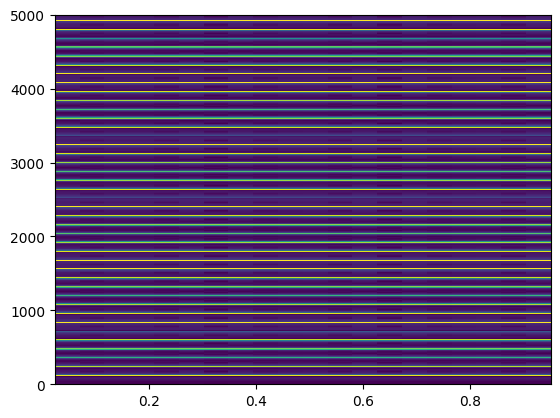

In [13]:
# Generate harmonics based on fundamental frequency
f0 = 120
harmonics = sum(sinewave(f) for f in range(f0, 10000, f0))

plot_spectrogram(harmonics, 44100, ylim=[0, 5000])
Audio(harmonics, rate=44100)

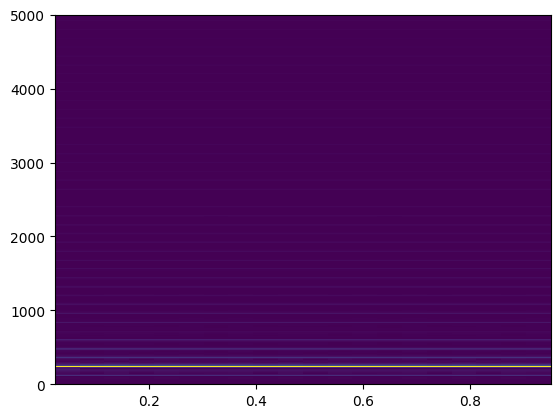

In [14]:
def bandpass_filter(data, lowcut, highcut, sampling_rate, order=1):
    b, a = scipy.signal.butter(order, [lowcut, highcut], fs=sampling_rate, btype='band')
    y = scipy.signal.lfilter(b, a, data)
    return y

# Filter harmonics based on first formant frequency
f1 = 240
filtered_harmonics_f1 = bandpass_filter(harmonics, f1 - 20, f1 + 20, 44100)

plot_spectrogram(filtered_harmonics_f1, 44100, ylim=[0, 5000])
Audio(filtered_harmonics_f1, rate=44100)

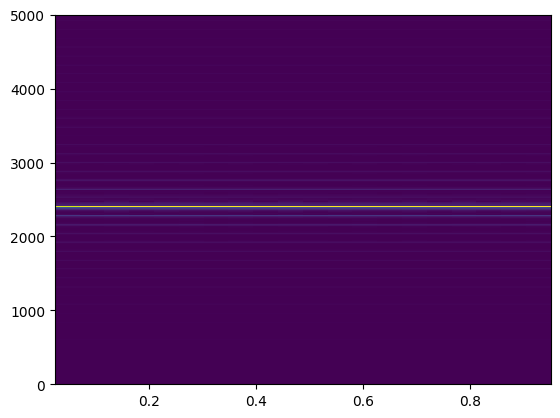

In [15]:
# Filter harmonics based on second formant frequency
f2 = 2400
filtered_harmonics_f2 = bandpass_filter(harmonics, f2 - 20, f2 + 20, 44100)

plot_spectrogram(filtered_harmonics_f2, 44100, ylim=[0, 5000])
Audio(filtered_harmonics_f2, rate=44100)

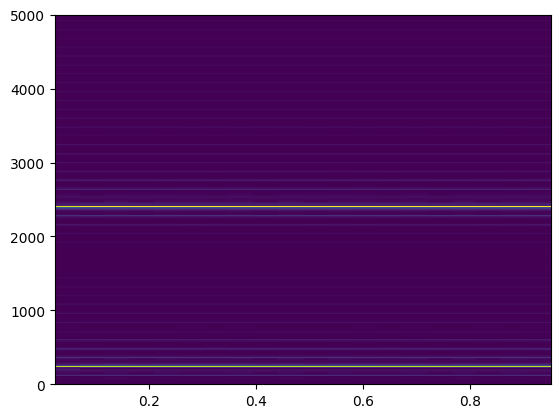

In [16]:
# Add the two filtered signals together
vowel = filtered_harmonics_f1 + filtered_harmonics_f2

plot_spectrogram(vowel, 44100, ylim=[0, 5000])
Audio(vowel, rate=44100)

In [17]:
# Putting it all in a function

def generate_vowel(f0, f1, f2, sampling_rate=44100):
    harmonics = sum(sinewave(f) for f in range(f0, 10000, f0))
    filtered_harmonics_f1 = bandpass_filter(harmonics, f1 - 20, f1 + 20, sampling_rate)
    filtered_harmonics_f2 = bandpass_filter(harmonics, f2 - 20, f2 + 20, sampling_rate)
    return filtered_harmonics_f1 + filtered_harmonics_f2

i = generate_vowel(120, 240, 2400)
u = generate_vowel(120, 250, 595)
a = generate_vowel(120, 850, 1610)

In [20]:
Audio(i, rate=44100)

### Remembering the sampling rate is essential

In [21]:
audio, sampling_rate = sf.read('tongue-twister.wav')
print(audio.shape)
print(sampling_rate)
Audio(audio, rate=22050)

(263808,)
44100


### Multiple audio channels

- So far, we've only talked about **mono** audio (1 channel).
- **Stereo** audio has 2 channels: left and right.
- **Surround sound** (common in cinemas) can have 8 or even more channels.

If we have $n$ channels, we essentially have $n$ separate audio signals.

In [24]:
audio, sampling_rate = sf.read('tongue-twister-stereo.wav')
print(audio.shape)
print(audio)
Audio(audio.T, rate=44100)

(263808, 2)
[[ 0.          0.        ]
 [ 0.          0.        ]
 [ 0.          0.        ]
 ...
 [-0.0020752  -0.0020752 ]
 [-0.00048828 -0.00048828]
 [ 0.00082397  0.00082397]]


Converting stereo to mono:

In [23]:
audio_mono = audio.mean(axis=1)
print(audio_mono.shape)
print(audio_mono)
Audio(audio_mono, rate=44100)

(263808,)
[ 0.          0.          0.         ... -0.0020752  -0.00048828
  0.00082397]


### Packages for audio processing

- [soundfile](https://python-soundfile.readthedocs.io): basic reading and writing
- [numpy](https://numpy.org): low-level inspection/editing (cropping, concatenation, channel selection, ...)
- [scipy](https://scipy.org): low-level signal processing (filters, spectrograms, ...)
- [librosa](https://librosa.org): high-level speech/music processing (beat tracking, feature extraction, effects, ...)

## Image data

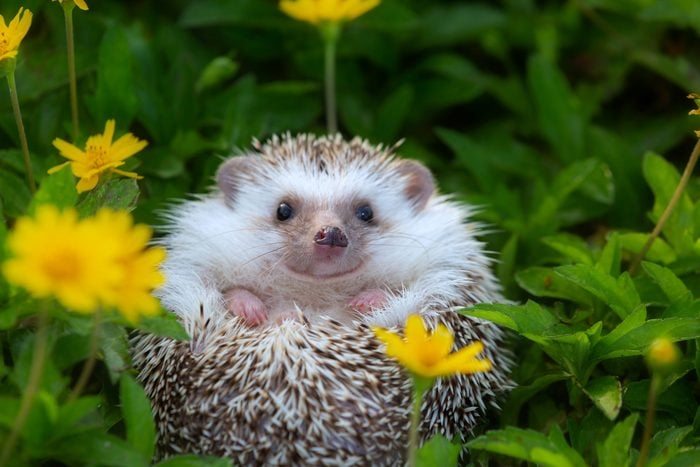

In [2]:
import PIL.Image

image = PIL.Image.open("hedgehog.jpg")
image

### Images as 3-dimensional arrays

In [26]:
image_array = np.asarray(image)
image_array.shape

(467, 700, 3)

In [27]:
image_array

array([[[ 25,  52,   1],
        [ 27,  54,   1],
        [ 28,  57,   3],
        ...,
        [ 64, 106,   6],
        [ 61, 106,   5],
        [ 59, 104,   3]],

       [[ 25,  52,   1],
        [ 26,  55,   1],
        [ 28,  57,   1],
        ...,
        [ 65, 107,   7],
        [ 62, 106,   8],
        [ 60, 105,   4]],

       [[ 23,  52,   0],
        [ 25,  54,   0],
        [ 27,  56,   0],
        ...,
        [ 66, 108,  10],
        [ 63, 107,  10],
        [ 62, 106,   8]],

       ...,

       [[ 55,  73,  13],
        [ 53,  73,  10],
        [ 50,  70,   9],
        ...,
        [ 74, 106,  21],
        [ 79, 108,  24],
        [ 81, 111,  25]],

       [[ 55,  73,  13],
        [ 54,  72,  12],
        [ 50,  70,   9],
        ...,
        [ 84, 113,  31],
        [ 88, 116,  32],
        [ 89, 117,  33]],

       [[ 55,  73,  13],
        [ 54,  72,  12],
        [ 50,  70,   9],
        ...,
        [ 90, 119,  37],
        [ 94, 122,  38],
        [ 95, 123,  39]]

### RGB

Computer screens display colors as combinations of red, green, and blue light:

![RGB pixels up close](img/rgb-pixels.png)

Usually, RGB images use 1 byte per color:

| R | G | B | Color |
| --- | --- | --- | --- |
| 0 | 0 | 0 | <div style="background-color: #000000; width: 30px; height: 10px" /> |
| 255 | 255 | 255 | <div style="background-color: #FFFFFF; width: 30px; height: 10px" /> |
| 128 | 128 | 128 | <div style="background-color: #808080; width: 30px; height: 10px" /> |
| 255 | 0 | 0 | <div style="background-color: #FF0000; width: 30px; height: 10px" /> |
| 0 | 255 | 0 | <div style="background-color: #00FF00; width: 30px; height: 10px" /> |
| 0 | 0 | 255 | <div style="background-color: #0000FF; width: 30px; height: 10px" /> |
| 177 | 127 | 4 | <div style="background-color: #B17F04; width: 30px; height: 10px" /> |

Colors are often represented in hexadecimal notation by concatenating the R, G, and B values:

| RGB | Color |
| --- | --- |
| #FF0000 | <div style="background-color: #FF0000; width: 30px; height: 10px" /> |
| #000088 | <div style="background-color: #000088; width: 30px; height: 10px" /> |
| #A100FF | <div style="background-color: #A100FF; width: 30px; height: 10px" /> |

### Color channels

The R, G, and B channels of an image can be separated:

In [28]:
r = image_array[:, :, 0]
g = image_array[:, :, 1]
b = image_array[:, :, 2]

r.shape

(467, 700)

<Axes: >

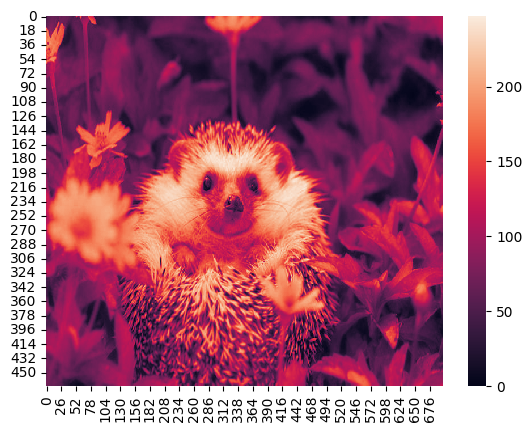

In [29]:
sns.heatmap(g)

A simple way to convert an RGB image to black-and-white:

In [30]:
# Average the RGB channels
average = (r / 3 + g / 3 + b / 3).astype(np.uint8)
average.shape

(467, 700)

In [31]:
# Use the averaged array for all three channels
grayscale = np.stack([average] * 3, axis=2)
grayscale.shape

(467, 700, 3)

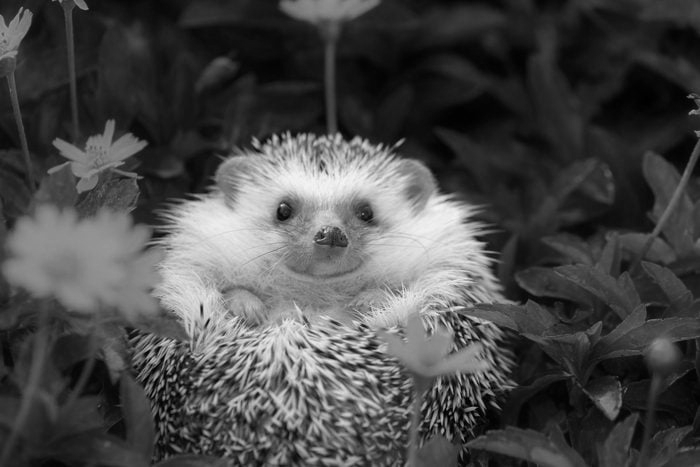

In [32]:
# Convert the result back to a PIL image
PIL.Image.fromarray(grayscale)

### Adding an alpha channel: RGBA

- The alpha channel determines the transparency of each pixel.
- 0: fully transparent, 255: fully opaque.
- JPEG does not support alpha channels, but PNG does.

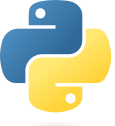

In [3]:
image = PIL.Image.open("python-logo.png")
image

In [6]:
image_array = np.asarray(image)
image_array.shape

(126, 115, 4)

<Axes: >

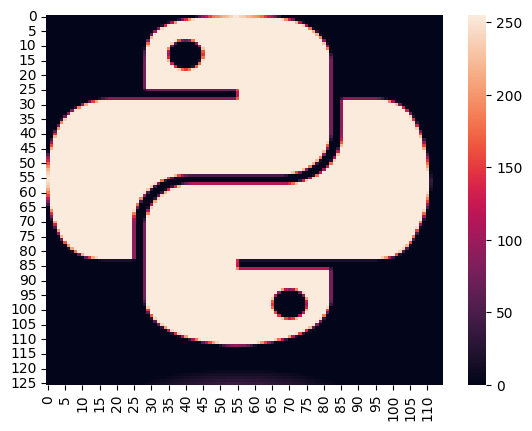

In [7]:
alpha = image_array[:, :, 3]
sns.heatmap(alpha)

### Cropping, resizing, and rotating images with PIL

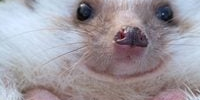

In [8]:
image = PIL.Image.open("hedgehog.jpg")
image.crop((200, 200, 400, 300))  # (left, top, right, bottom)

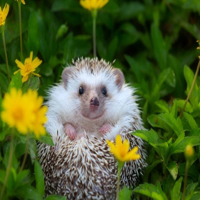

In [9]:
image.resize((200, 200))

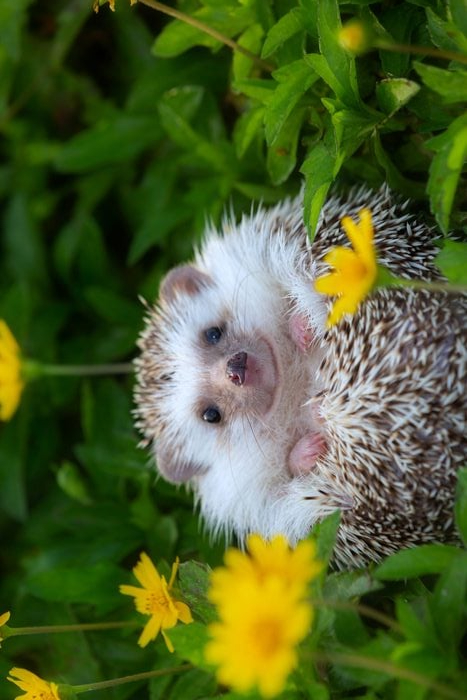

In [10]:
image.rotate(90, expand=True)

### Lossless vs. lossy compression

![Lossless (PNG) vs lossy (JPEG) compression](img/compression.png)

| Format | Compression | Transparency | Use case |
| --- | --- | --- | --- |
| PNG | lossless | yes | Logos, icons, screenshots |
| JPEG | lossy | no | Photographs |

### Packages for image processing

- [numpy](https://numpy.org): low-level inspection/editing
- [PIL/Pillow](https://python-pillow.org): basic editing (cropping, resizing, rotating, ...)
- [scikit-image](https://scikit-image.org): more advanced manipulation/analysis (filters, segmentation, ...)
- [opencv-python](https://opencv.org): computer vision (face detection, object tracking, ...)

## Video data

What we colloquially call a "video" usually consists of:

- A sequence of images (**frames**)
- An audio signal (one or more channels)

- **Frame rate** [fps]: number of frames per second
- **Resolution** [pixels]: width x height of each frame

The frame rate is comparable to the sampling rate in audio, but it is usually much lower (24-60 fps vs. 44100 Hz).

### MPEG-4 / MP4 file format

MP4 is a commonly used **container format** that can store:

- Video: encoded as a sequence of frames
- Audio: encoded as a sequence of samples
- Subtitles: encoded as text
- Other data

MP4 is optimized for **streaming**:

- Multiple parallel streams of data (video, audio, subtitles) are interleaved/multiplexed into a single stream.
- This allows us to start playing the video before the entire file has been downloaded or read into memory.

![Multiplexing multiple streams](img/multiplexing.png)

### [FFmpeg](https://ffmpeg.org)

- An open-source library and CLI for working with audio and video files (not only MPEG-based ones).
- Many software products (media players, editors, etc.) use FFmpeg internally.
- Python libraries for working with video usually wrap FFmpeg.

**→ If you're interested in working with video data, learning FFmpeg is a good idea.**

### Me at the zoo

In [36]:
Video("me-at-the-zoo.mp4")

#### Inspecting the multiplexed data stream

In [ ]:
import av

with av.open("me-at-the-zoo.mp4") as container:
    stream = container.decode()
    for data in stream:
        print(data)

#### Extracting video frames

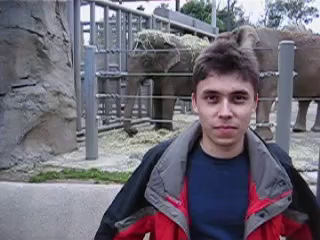

In [41]:
with av.open("me-at-the-zoo.mp4") as container:
    video_stream = container.decode(video=0)
    frame = next(video_stream)
    image = frame.to_image()
image

#### Extracting audio

In [42]:
with av.open("me-at-the-zoo.mp4") as container:
    audio_stream = container.decode(audio=0)
    frame = next(audio_stream)
    audio = frame.to_ndarray()

audio.shape

(1, 1024)

In [43]:
audio

array([[0., 0., 0., ..., 0., 0., 0.]], shape=(1, 1024), dtype=float32)

In [44]:
with av.open("me-at-the-zoo.mp4") as container:
    full_audio = np.zeros((1, 0))
    for frame in container.decode(audio=0):
        audio = frame.to_ndarray()
        full_audio = np.concatenate([full_audio, audio], axis=1)

print(full_audio.shape)
Audio(full_audio[0], rate=frame.sample_rate)

(1, 840704)


### [MoviePy](https://zulko.github.io/moviepy/)

> **NOTE:** The latest version of MoviePy is not compatible with the latest version of NumPy. Install `numpy==1.24.4` to avoid issues.

In [ ]:
from moviepy import VideoFileClip

clip = VideoFileClip("me-at-the-zoo.mp4")
frame = clip.get_frame(0)

print(frame.shape)
PIL.Image.fromarray(frame)

In [50]:
audio = clip.audio
audio_array = audio.to_soundarray()

print(audio_array.shape)
Audio(audio_array.T, rate=audio.fps)

(840546, 2)


## Conclusion

- **Audio** signal = sequence of float-valued samples
  - **Sample rate**: number of samples played per second
  - **Frequency**: number of oscillations per second in a periodic signal
  - **Channels**: parallel audio signals  
    **mono** = 1 channel, **stereo** = 2 channels
- **Image** = array of RGB(A) values
  - **Resolution**: width/height in pixels
  - **Color channels**: R = red, G = green, B = blue, A = alpha
  - **Compression**: lossy (e.g., JPEG) vs. lossless (e.g., PNG)
- **Video** = multimodal data streams (video, audio, subtitles)
  - **Frame rate**: number of video frames (images) played per second

Tools / libraries:

- NumPy for sample-level/pixel-level processing
- **Audio**: FFmpeg, `soundfile`, `librosa`
- **Image**: `PIL`/Pillow, `scikit-image`, `opencv-python`
- **Video**: FFmpeg, `av`, `moviepy`